In [1]:
import os
os.environ['CUDA_DEVICE_ORDER'] = 'PCI_BUS_ID'
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [2]:
import numpy as np
import pandas as pd

# import tqdm.notebook as tq
import tqdm as tq

import random

import torch
import torch.nn as nn

from torch.utils.data import Dataset, DataLoader

from sklearn.preprocessing import OneHotEncoder

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [30, 10]

In [3]:
random_seed = 13

torch.manual_seed(random_seed)
random.seed(random_seed)
np.random.seed(random_seed)

In [4]:
dataset = 'FordB'

from sktime.datasets import load_UCR_UEA_dataset

X_train, y_train = load_UCR_UEA_dataset(name=dataset, split='train', return_type='numpyflat')
X_test, y_test = load_UCR_UEA_dataset(name=dataset, split='test', return_type='numpyflat')

In [5]:
print(f'Length training data: {len(X_train)} labels: {len(y_train)} test data: {len(X_test)} labels: {len(y_test)}')

Length training data: 3636 labels: 3636 test data: 810 labels: 810


In [6]:
encoder = OneHotEncoder(categories='auto', sparse_output=False)

y_train_ohe = encoder.fit_transform(np.expand_dims(y_train, axis=-1))
y_test_ohe = encoder.transform(np.expand_dims(y_test, axis=-1))

y_train_norm = y_train_ohe.argmax(axis=-1)
y_test_norm = y_test_ohe.argmax(axis=-1)

In [7]:
class FordADataset(Dataset):

    def __init__(self, X, y):
        self.X = X
        self.y = y
    
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        inputs = self.X[idx]
        label = self.y[idx]
        
        return inputs, label

In [8]:
dataset_train = FordADataset(X_train, y_train_ohe)
dataset_test = FordADataset(X_test, y_test_ohe)

In [9]:
dataloader_train = DataLoader(dataset_train, batch_size=120, shuffle=True)
dataloader_train_not_shuffled = DataLoader(dataset_train, batch_size=120, shuffle=False)
dataloader_test = DataLoader(dataset_test, batch_size=120, shuffle=False)

In [10]:
class CNN(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.conv1 = nn.Sequential(
            nn.Conv1d(1, 10, kernel_size=3, stride=1),
            nn.BatchNorm1d(10),
            nn.ReLU(inplace=True)
        )
        self.conv2 = nn.Sequential(
            nn.Conv1d(10, 50, kernel_size=3, stride=1),
            nn.BatchNorm1d(50),
            nn.MaxPool1d(3),
            nn.ReLU(inplace=True)
        )
        self.conv3 = nn.Sequential(
            nn.Conv1d(50, 50, kernel_size=3, stride=1),
            nn.BatchNorm1d(50),
            nn.MaxPool1d(3),
            nn.ReLU(inplace=True)
        )
        
        self.fc1 = nn.Sequential(
            nn.Linear(50 * 54, 50),
            nn.Dropout(0.5),
            nn.ReLU(inplace=True)
        )
        self.fc2 = nn.Sequential(
            nn.Linear(50, 2),
            nn.Softmax(-1)
        )
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)

        batch_size = x.shape[0]
        x = x.view(batch_size, -1)
        x = self.fc1(x)
        x = self.fc2(x)
        
        return x

# Training of the model

In [11]:
def trainer(model, dataloader_train, criterion):
    running_loss = 0

    model.train()

    for idx, (inputs, labels) in enumerate(dataloader_train):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        optimizer.zero_grad()
        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss


def validator(model, dataloader_test, criterion):
    running_loss = 0

    model.eval()

    for idx, (inputs, labels) in enumerate(dataloader_test):
        inputs = inputs.reshape(inputs.shape[0], 1, -1)
        inputs = inputs.float().to(device)
        labels = labels.float().to(device)

        preds = model(inputs)
        loss = criterion(preds, labels.argmax(dim=-1))
        
        running_loss += loss.item()

    train_loss = running_loss / len(dataloader_train)
    
    return train_loss

In [12]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = CNN().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
loss = nn.CrossEntropyLoss()

In [13]:
epochs = 500

for epoch in range(epochs):
    train_loss = trainer(model, dataloader_train, loss)
    if epoch % 10 == 0:
        print('Val', validator(model, dataloader_test, loss))
        print('Train', train_loss)

Val 0.156902838137842
Train 0.6705602388228139
Val 0.1414254653838373
Train 0.4296017375684554
Val 0.13567091380396196
Train 0.39843602238162873
Val 0.13059083300252114
Train 0.3848838575424687
Val 0.12829144539371615
Train 0.37181918755654364
Val 0.1296003557020618
Train 0.3619017187626131
Val 0.13516902731310937
Train 0.3568969609275941
Val 0.1312517523765564
Train 0.34963871106024713
Val 0.12580950798526888
Train 0.3416775243897592
Val 0.12756416490001063
Train 0.3371413080923019
Val 0.1272092423131389
Train 0.33559770353378787
Val 0.12738460302352905
Train 0.3314601029119184
Val 0.12671939980599187
Train 0.3287928296673682
Val 0.1280459030981987
Train 0.33200505952681264
Val 0.1316468369576239
Train 0.3260422493180921
Val 0.12808628236093828
Train 0.32725515865510507
Val 0.13152695086694532
Train 0.3245606009037264
Val 0.1307850460852346
Train 0.32361319468867394
Val 0.1317479379715458
Train 0.3229207185006911
Val 0.1296459359507407
Train 0.32188040691037334
Val 0.135173499584198
T

In [14]:
model.eval()

preds = []
labels = []
for x in dataloader_train_not_shuffled:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Train', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_train_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Train 0.9956


In [15]:
model.eval()

preds = []
labels = []
for x in dataloader_test:
    input_, label_ = x
    input_ = input_.reshape(input_.shape[0], 1, -1)
    input_ = input_.float().to(device)
    label_ = label_.float().to(device)

    pred_ = model(input_)
    preds.extend(pred_)
    labels.extend(label_)

preds = torch.stack(preds)
labels = torch.stack(labels)
print('Prediction Accuracy Test', np.round((preds.argmax(dim=-1) == labels.argmax(dim=-1)).int().sum().float().item() / len(preds), 4))

y_test_pred = preds.cpu().detach().numpy().round(3)

Prediction Accuracy Test 0.7062


# Save results as json

In [16]:
%load_ext autoreload
%autoreload 2

In [17]:
import exp_perturbation_analysis as exp_pa

import exp_stability_indicator as exp_si

import exp_plots as exp_pl

import scipy as sp

In [18]:
from captum.attr import GradientShap, DeepLiftShap, IntegratedGradients, ShapleyValueSampling, Saliency, DeepLift

In [19]:
import matplotlib as mpl

cmap = 'tab10'

In [20]:
attribution_measure = exp_si.attribution_stability_indicator
get_asi_for_dataset = exp_si.get_asi_for_dataset

In [21]:
sample_idx = 0
sample_ts_np, sample_l = dataloader_test.dataset[sample_idx]

sample, label = dataset_train[0]
shape = sample_ts_np.reshape(1, -1).shape

baselines = torch.from_numpy(np.array([dataset_test[torch.randint(len(dataset_test), (1,))][0] for _ in range(10)])).reshape(-1, *shape).float().to(device)



attribution_techniques = [
    ['Saliency', Saliency, {}],
    ['GradientShap', GradientShap, {'baselines': baselines}],
    
    ['DeepLift', DeepLift, {}],
    ['DeepLiftShap', DeepLiftShap, {'baselines': baselines}],
    
    ['IntegratedGradients', IntegratedGradients, {}],
    
#     ['ShapleyValueSampling', ShapleyValueSampling, {}],
]

for at in tq.tqdm(attribution_techniques):
    at_name, at_class, at_kwargs = at
    asi_core_tmp = attribution_measure(model, sample_ts_np, sample_l, at_class, at_kwargs, debug=True, weights=[0.5, 1, 0.5, 3], perturbation_fnc=exp_pa.delete_to_zero)

  0%|          | 0/5 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
100%|██████████| 5/5 [00:00<00:00, 31.41it/s]

XAI: Saliency
Original Pred:  [0. 1.]
Perturbed Pred: [1. 0.]

TS Correl: 0.14083966945479642
Att Correl: 0.5

Labels
TL  P1  Pd
 1   1   0

ASI
0.31408

XAI: GradientShap
Original Pred:  [0. 1.]
Perturbed Pred: [1. 0.]

TS Correl: 0.17731337180337592
Att Correl: 0.5191824071980705

Labels
TL  P1  Pd
 1   1   0

ASI
0.32924

XAI: DeepLift
Original Pred:  [0. 1.]
Perturbed Pred: [1. 0.]

TS Correl: 0.2795415416709306
Att Correl: 0.5564907395253337

Labels
TL  P1  Pd
 1   1   0

ASI
0.36185

XAI: DeepLiftShap
Original Pred:  [0. 1.]
Perturbed Pred: [1. 0.]

TS Correl: 0.27570988599825175
Att Correl: 0.4899405459793194

Labels
TL  P1  Pd
 1   1   0

ASI
0.32154

XAI: IntegratedGradients
Original Pred:  [0. 1.]
Perturbed Pred: [1. 0.]

TS Correl: 0.2569062943409869
Att Correl: 0.5432904980861394

Labels
TL  P1  Pd
 1   1   0

ASI
0.35166



In [31]:
loader = dataloader_train_not_shuffled
ret_train = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], exp_pa.delete_to_zero)

  0%|          | 0/3636 [00:00<?, ?it/s]/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(
/home/schlegel/.conda/captum/lib/python3.10/site-packages/captum/attr/_core/deep_lift.py:304: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  warnings.warn(
100%|██████████| 3636/3636 [10:24<00:00,  5.83it/s]


In [32]:
loader = dataloader_test
ret_test = get_asi_for_dataset(loader, model, attribution_techniques, [0.5, 1, 0.5, 3], exp_pa.delete_to_zero)

100%|██████████| 810/810 [01:45<00:00,  7.65it/s]


In [33]:
generate_projections = exp_pl.generate_projections
generate_histogram = exp_pl.generate_histogram

Name: Saliency
ASI: 1692.522, Flips: 1784


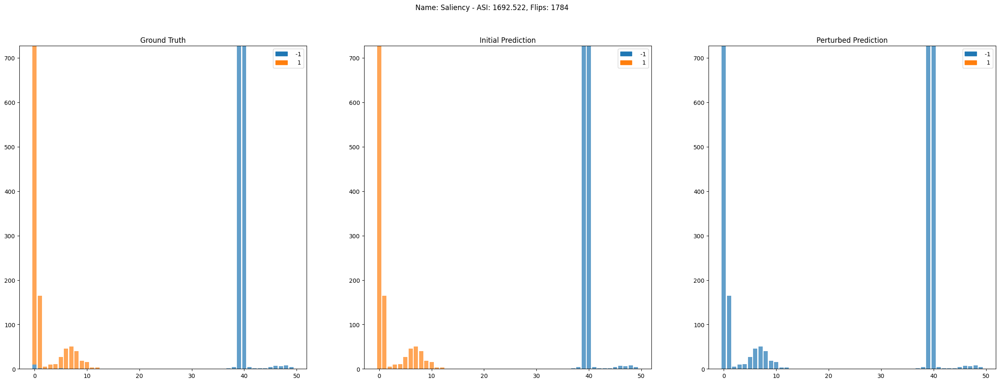

Name: GradientShap
ASI: 1733.946, Flips: 1784


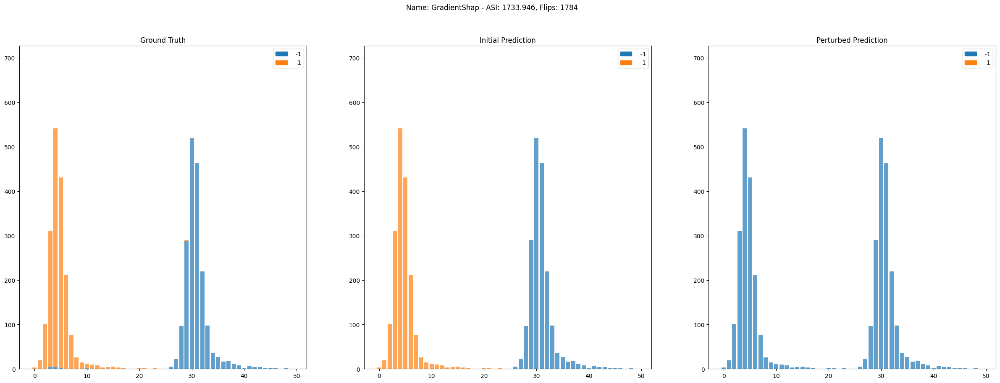

Name: DeepLift
ASI: 1833.851, Flips: 1784


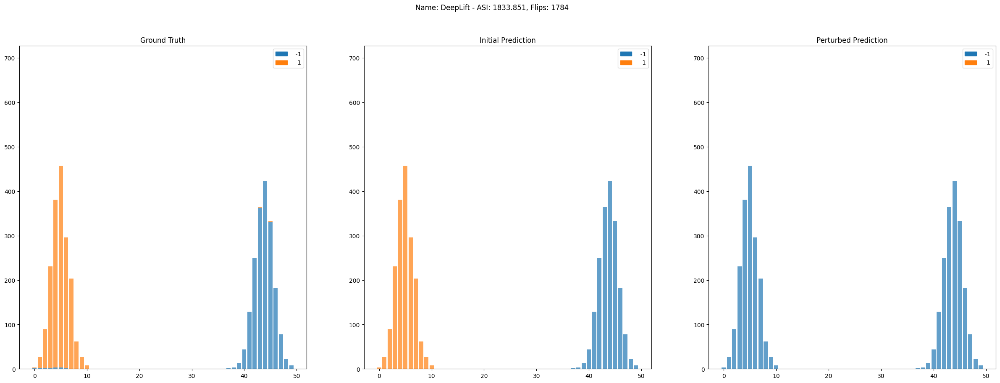

Name: DeepLiftShap
ASI: 1822.628, Flips: 1784


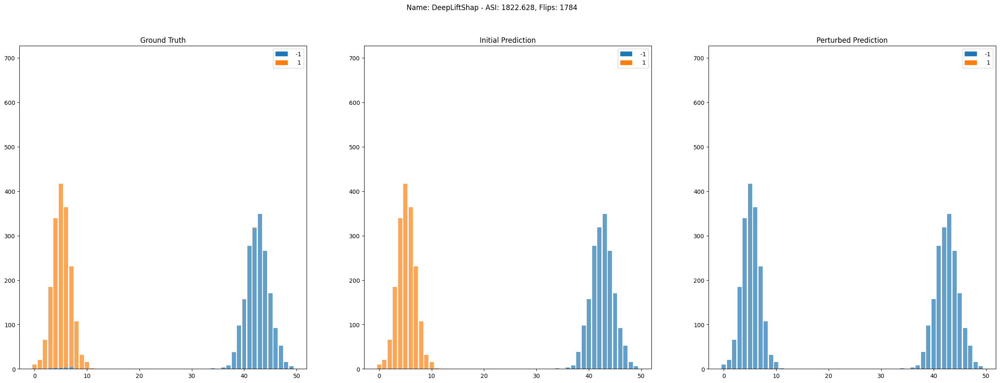

Name: IntegratedGradients
ASI: 1797.734, Flips: 1784


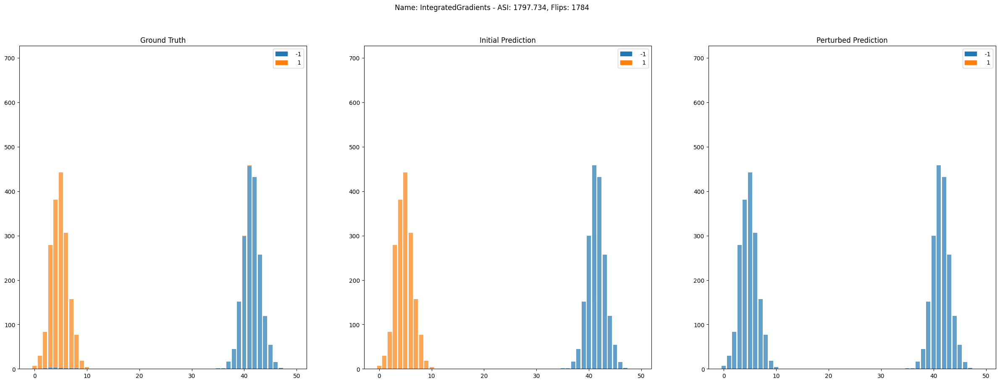

In [34]:
generate_histogram(ret_train, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 1692.522, Flips: 1784


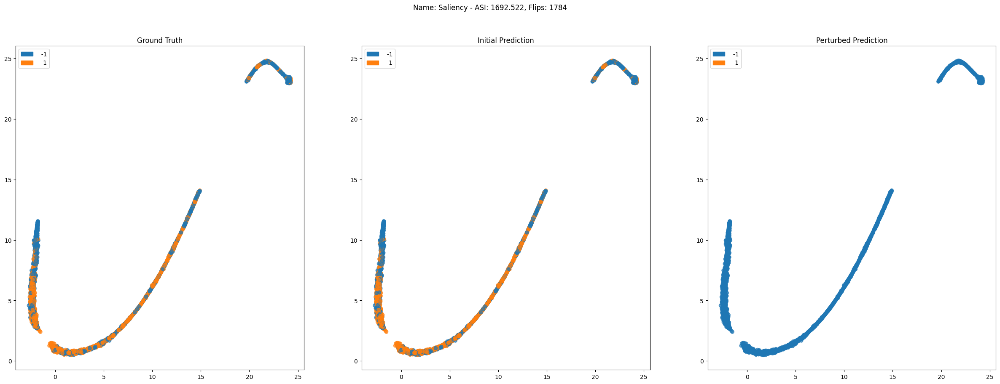

Name: GradientShap
ASI: 1733.946, Flips: 1784


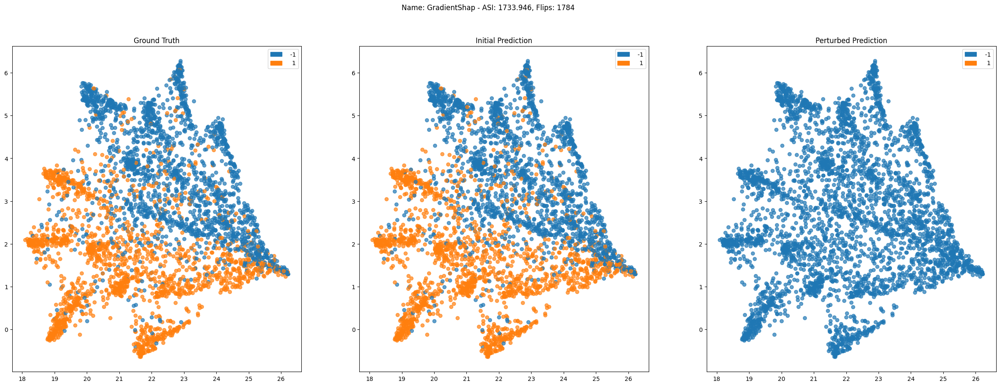

Name: DeepLift
ASI: 1833.851, Flips: 1784


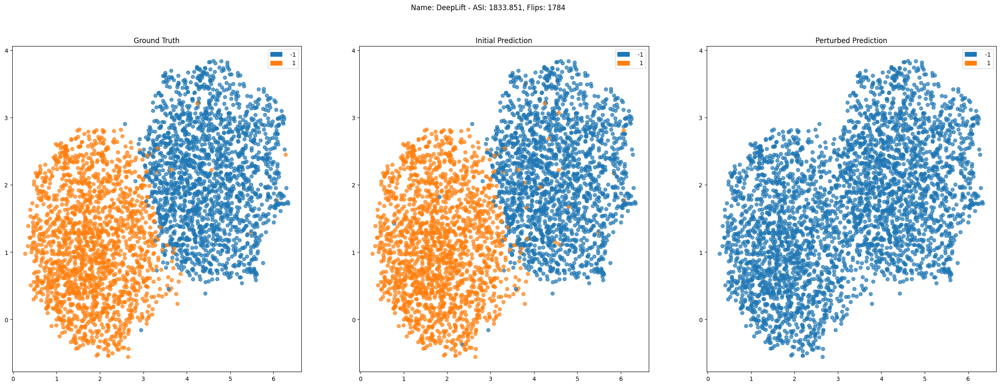

Name: DeepLiftShap
ASI: 1822.628, Flips: 1784


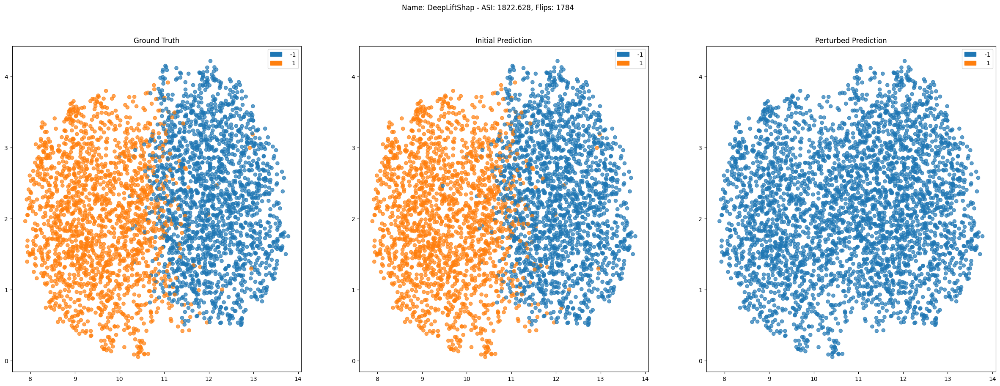

Name: IntegratedGradients
ASI: 1797.734, Flips: 1784


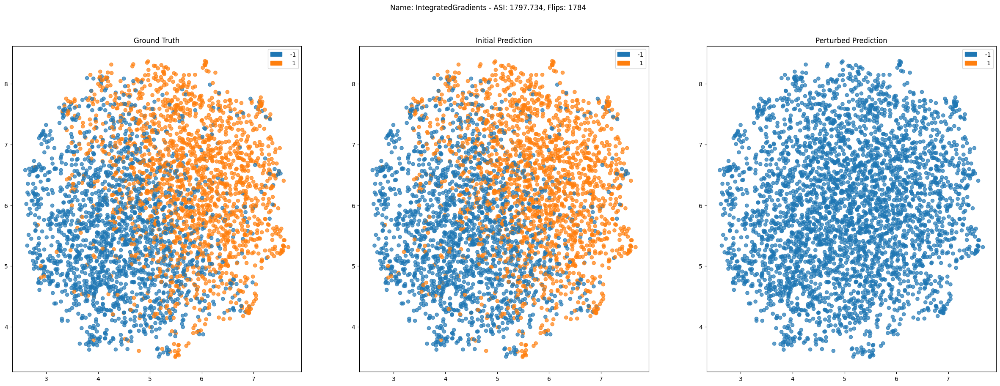

In [35]:
generate_projections(ret_train, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 352.809, Flips: 473


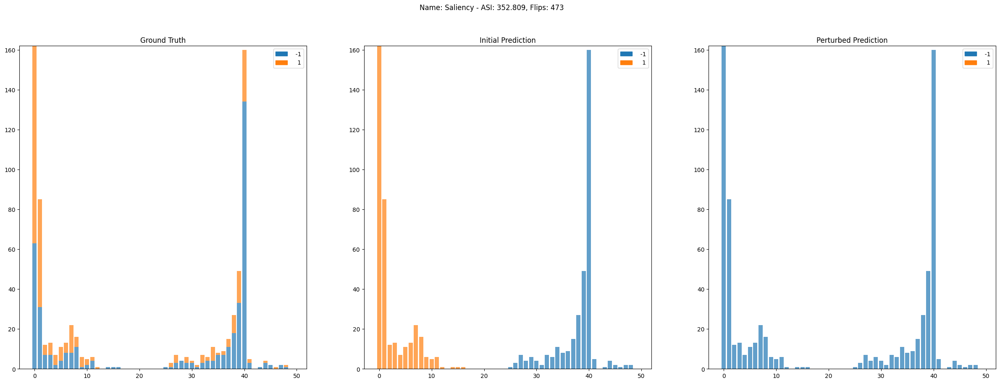

Name: GradientShap
ASI: 359.959, Flips: 473


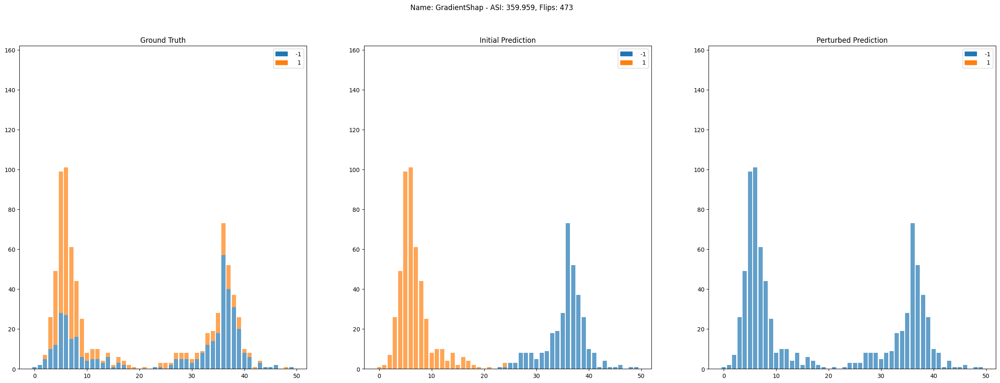

Name: DeepLift
ASI: 382.073, Flips: 473


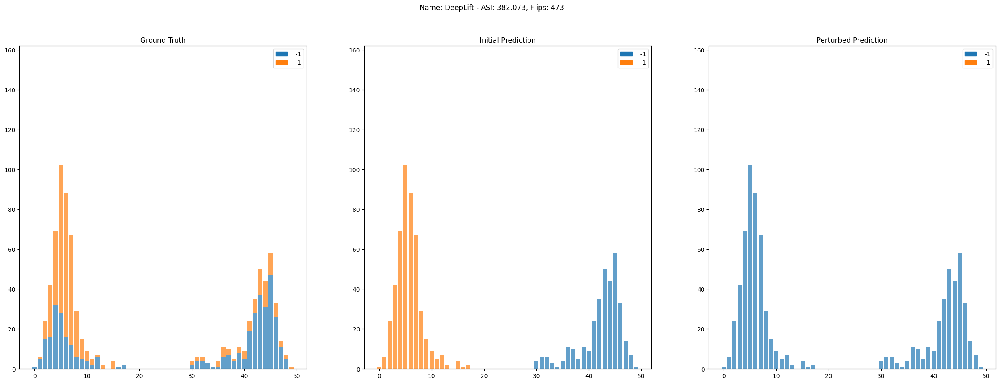

Name: DeepLiftShap
ASI: 377.066, Flips: 473


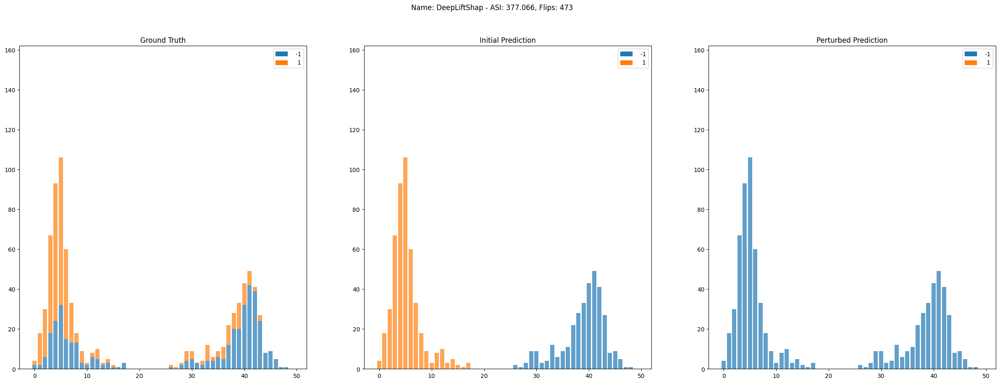

Name: IntegratedGradients
ASI: 371.751, Flips: 473


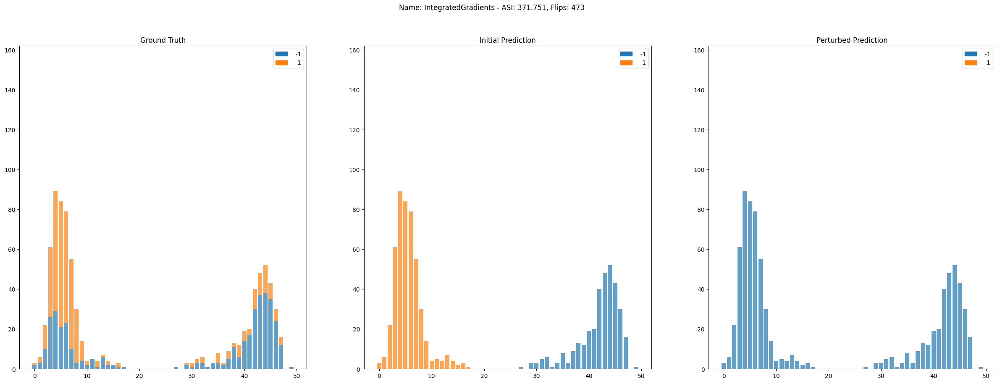

In [36]:
generate_histogram(ret_test, labels=list(np.unique(y_train)))

Name: Saliency
ASI: 352.809, Flips: 473


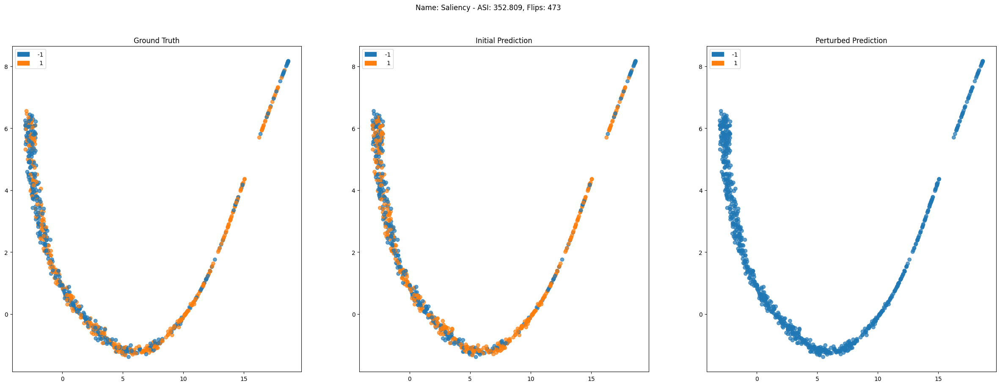

Name: GradientShap
ASI: 359.959, Flips: 473


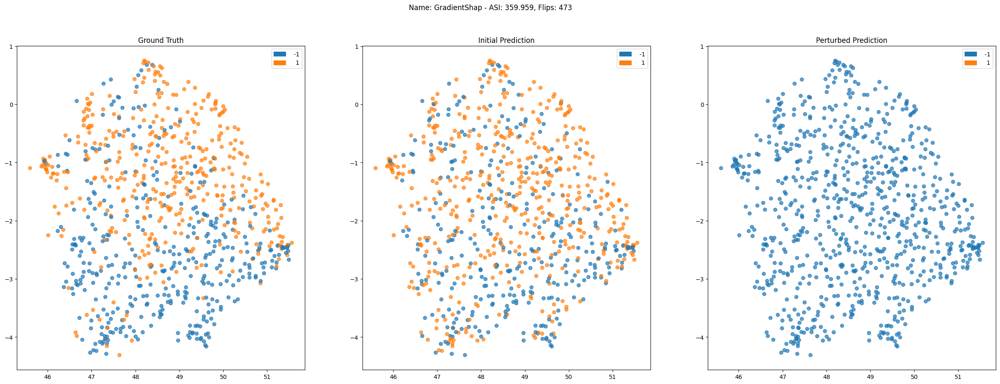

Name: DeepLift
ASI: 382.073, Flips: 473


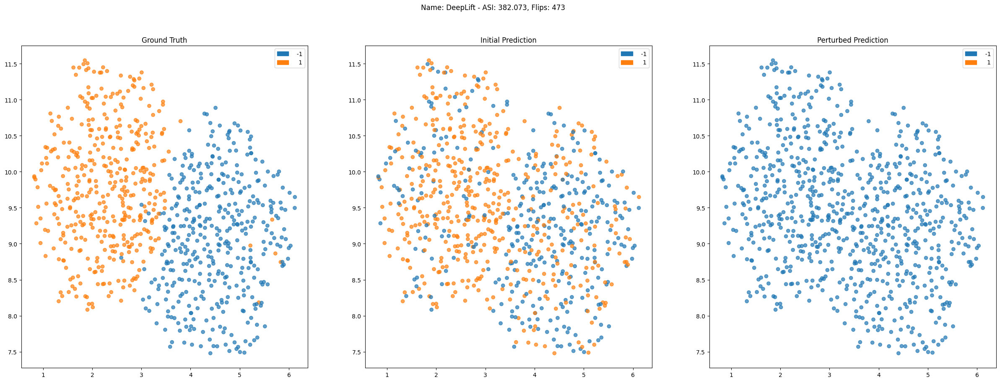

Name: DeepLiftShap
ASI: 377.066, Flips: 473


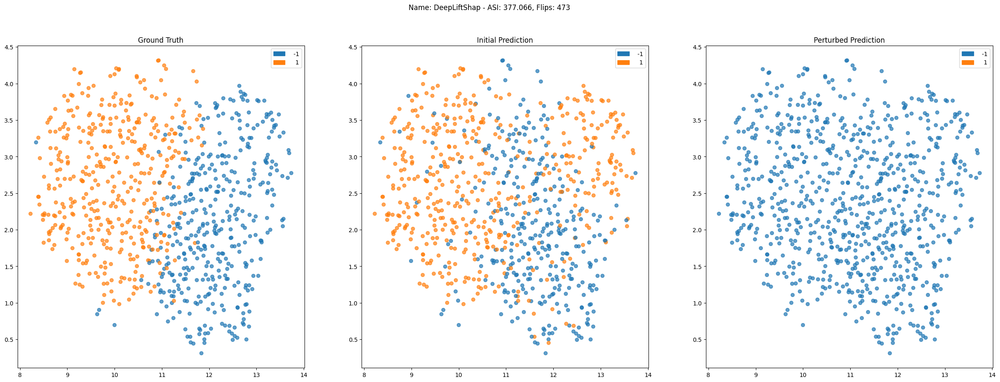

Name: IntegratedGradients
ASI: 371.751, Flips: 473


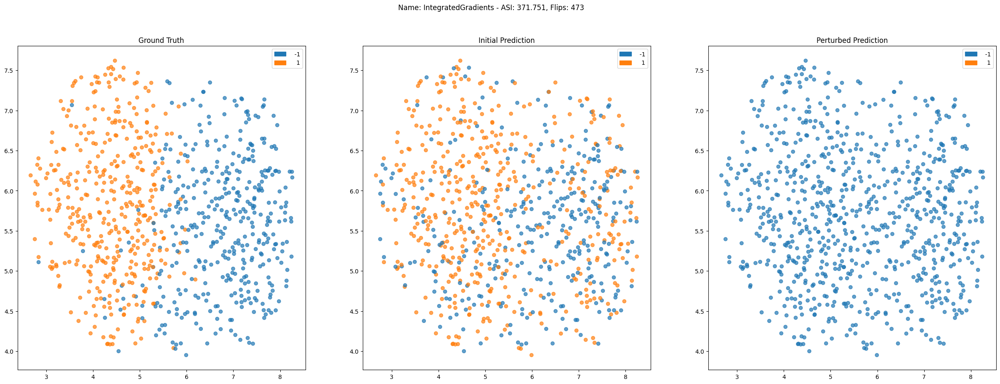

In [37]:
generate_projections(ret_test, labels=list(np.unique(y_train)))

In [27]:
torch.save(model, 'models/ford-b-cnn.pth')